(cfa_sem_notebook)=
# Confirmatory Factor Analysis and Structural Equation Models

:::{post} September, 2024
:tags: cfa, sem, regression, 
:category: intermediate, reference
:author: Nathaniel Forde
:::

> "Evidently, the notions of relevance and dependence are far more basic to human reasoning than the numerical values attached to probability judgments...the language used for representing probabilistic information should allow assertions about dependency relationships to be expressed qualitatively, directly, and explicitly" - Pearl in _Probabilistic Reasoning in Intelligent Systems_ {cite:t}`pearl1985prob`

Measurement data is psychometrics is often derived from a strategically constructed survey aimed at a particular target phenomena. Some intuited, but not yet measured, concept that arguably plays a determining role in human action, motivation or sentiment. The relative “fuzziness” of the subject matter in psychometrics has had a catalyzing effect on the methodological rigour sought in the science. 

Survey designs are agonized over for correct tone and rhythm of sentence structure. Measurement scales are doubly checked for reliability and correctness. The literature is consulted and questions are refined. Analysis steps are justified and tested under a wealth of modelling routines. Model architectures are defined and refined to better express the hypothesized structures in the data-generating process. We will see how such due diligence leads to powerful and expressive models that grant us tractability on thorny questions of human affect. 

Throughout we draw on Roy Levy and Robert J. Mislevy's excellent _Bayesian Psychometric Modeling_. 

In [1]:
import warnings

import arviz as az
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pymc as pm
import pytensor.tensor as pt
import seaborn as sns

warnings.filterwarnings("ignore", category=RuntimeWarning)

In [2]:
%config InlineBackend.figure_format = 'retina'  # high resolution figures
az.style.use("arviz-darkgrid")
rng = np.random.default_rng(42)

### Latent Constructs and Measurement

Our data is borrowed from work by Boris Mayer and Andrew Ellis found [here](https://methodenlehre.github.io/SGSCLM-R-course/cfa-and-sem-with-lavaan.html#structural-equation-modelling-sem). They demonstrate CFA and SEM modelling with lavaan.

We have survey responses from ~300 individuals who have answered questions regarding their upbringing, self-efficacy and reported life-satisfaction. The hypothetical dependency structure in this life-satisfaction data-set posits a moderated relationship between scores related to life-satisfaction, parental and family support and self-efficacy. It is not a trivial task to be able to design a survey that can elicit answers plausibly mapped to each of these “factors” or themes, never mind finding a model of their relationship that can inform us as to the relative of impact of each on life-satisfaction outcomes.

First let's pull out the data and examine some summary statistics.

In [3]:
df = pd.read_csv("../data/sem_data.csv")
df.head()

,ID,region,gender,age,se_acad_p1,se_acad_p2,se_acad_p3,se_social_p1,se_social_p2,se_social_p3,sup_friends_p1,sup_friends_p2,sup_friends_p3,sup_parents_p1,sup_parents_p2,sup_parents_p3,ls_p1,ls_p2,ls_p3
0,1,west,female,13,4.857143,5.571429,4.500000,5.80,5.500000,5.40,6.5,6.5,7.0,7.0,7.0,6.0,5.333333,6.75,5.50
1,2,west,male,14,4.571429,4.285714,4.666667,5.00,5.500000,4.80,4.5,4.5,5.5,5.0,6.0,4.5,4.333333,5.00,4.50
2,10,west,female,14,4.142857,6.142857,5.333333,5.20,4.666667,6.00,4.0,4.5,3.5,7.0,7.0,6.5,6.333333,5.50,4.00
3,11,west,female,14,5.000000,5.428571,4.833333,6.40,5.833333,6.40,7.0,7.0,7.0,7.0,7.0,7.0,4.333333,6.50,6.25
4,12,west,female,14,5.166667,5.600000,4.800000,5.25,5.400000,5.25,7.0,7.0,7.0,6.5,6.5,7.0,5.666667,6.00,5.75


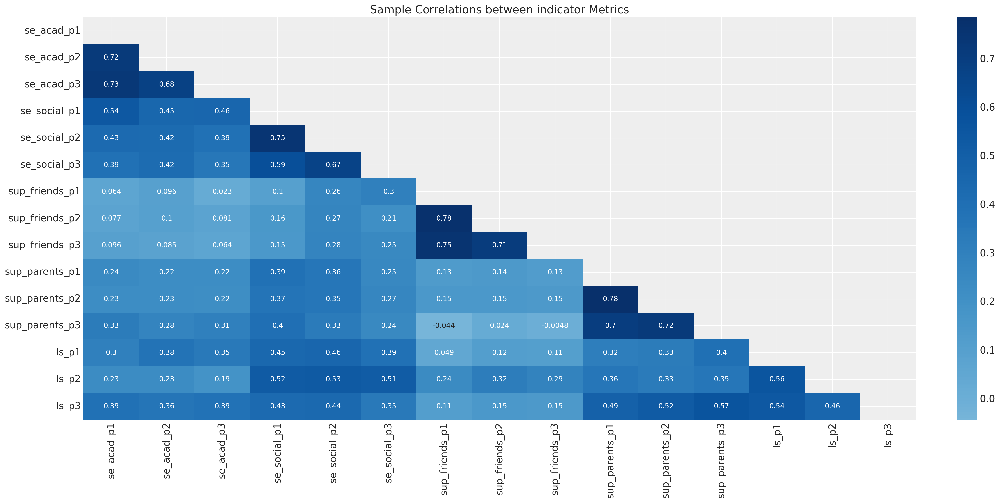

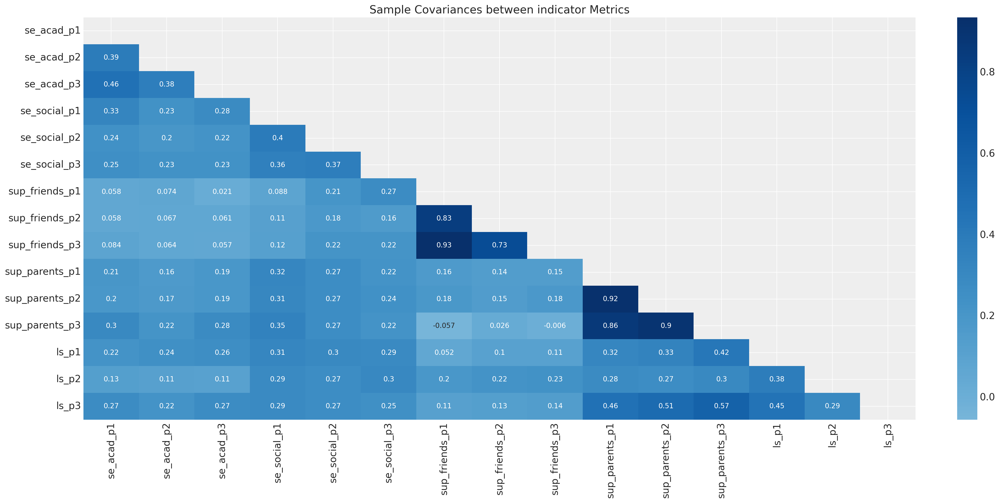

In [4]:
fig, ax = plt.subplots(figsize=(20, 10))
drivers = [c for c in df.columns if not c in ["region", "gender", "age", "ID"]]
corr_df = df[drivers].corr()
mask = np.triu(np.ones_like(corr_df, dtype=bool))
sns.heatmap(corr_df, annot=True, cmap="Blues", ax=ax, center=0, mask=mask)
ax.set_title("Sample Correlations between indicator Metrics")
fig, ax = plt.subplots(figsize=(20, 10))
sns.heatmap(df[drivers].cov(), annot=True, cmap="Blues", ax=ax, center=0, mask=mask)
ax.set_title("Sample Covariances between indicator Metrics");

The lens here on the sample covariance matrix is common in the traditional SEM modeling. CFA and SEM models are often estimated by fitting parameters to the data by optimising the parameter structure of the covariance matrix. Model assessment routines often gauge the model's ability to recover the sample covariance relations. There is a slightyly different (less constrained) approach taken in the Bayesian approach to estimating these models which focuses on the observed data rather than the derived summary statistics. 

Next we'll plot the pairplot to visualise the nature of the correlations

In [5]:
ax = sns.pairplot(df[drivers], kind="reg", corner=True, diag_kind="kde")
plt.suptitle("Pair Plot of Indicator Metrics with Regression Fits", fontsize=30);

/Users/nathanielforde/mambaforge/envs/pymc_causal/lib/python3.11/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


It's this wide-ranging set of relationships that we seek to distill in our CFA models. How can we take this complex joint distribution and structure it in a way that is plausible and interpretable?

## Measurement Models

A measurement model is a key component within the more general structural equation model. A measurement model specifies the relationships between observed variables (typically survey items or indicators) and their underlying latent constructs (often referred to as factors or latent variables). We start our presentation of SEM models more generally by focusing on a type of measurement model with it's own history - the confirmatory factor model (CFA) which specifies a particular structure to the relationships between our indicator variables and the latent factors. It is this structure which is up for confirmation in our modelling. 

We'll start by fitting a "simple" CFA model in `PyMC` to demonstrate how the pieces fit together, we'll then expand our focus. Here we ignore the majority of our indicator variables and focus on the idea that there are two latent constructs: (1) Social Self-efficacy and (2) Life Satisfaction. 

We're aiming to articulate a mathematical structure where our indicator variables $x_{ij}$ are determined by a latent factor $\text{Ksi}_{j}$ through an estimated factor loading $\lambda_{ij}$.  Functionally we have a set of equations with error terms $\psi_i$ for each individual.

$$ x_{1} = \tau_{1}  + \lambda_{11}\text{Ksi}_{1} + \psi_{1}  \\ 
x_{2} = \tau_{2}  + \lambda_{21}\text{Ksi}_{1} + \psi_{2} \\
 ... \\
x_{n} = \tau_{n}  + \lambda_{n2}\text{Ksi}_{2} + \psi_{3} 
$$ 

or more compactly

$$ \mathbf{x} = \tau + \Lambda\text{Ksi} + \Psi $$

The goal is to articulate the relationship between the different factors in terms of the covariances between these latent terms and estimate the relationships each latent factor has with the manifest indicator variables. At a high level, we're saying the joint distribution of the observed data can be represented through conditionalisation in the following schema.

$$p(\mathbf{x_{i}}^{T}.....\mathbf{x_{q}}^{T} | \text{Ksi}, \Psi, \tau, \Lambda) \sim Normal(\tau + \Lambda\cdot \text{Ksi}, \Psi) $$

We're making an argument that the multivariate observations $\mathbf{x}$ from each individual $q$ can be considered conditionally exchangeable and in this way represented via Bayesian conditionalisation via De Finetti's theorem. This is the Bayesian approach to the estimation of CFA and SEM models. We're seeking a conditionalisation structure that can retrodict the observed data based on latent constructs and hypothetical relationships among the constructs and the observed data points. We will show how to build these structures into our model below

Compiling...
Compilation time = 0:00:01.944688
Sampling...


  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

Sampling time = 0:00:04.980985
Transforming variables...
Transformation time = 0:00:00.376451
Computing Log Likelihood...
Log Likelihood time = 0:00:00.233430
Sampling: [likelihood]


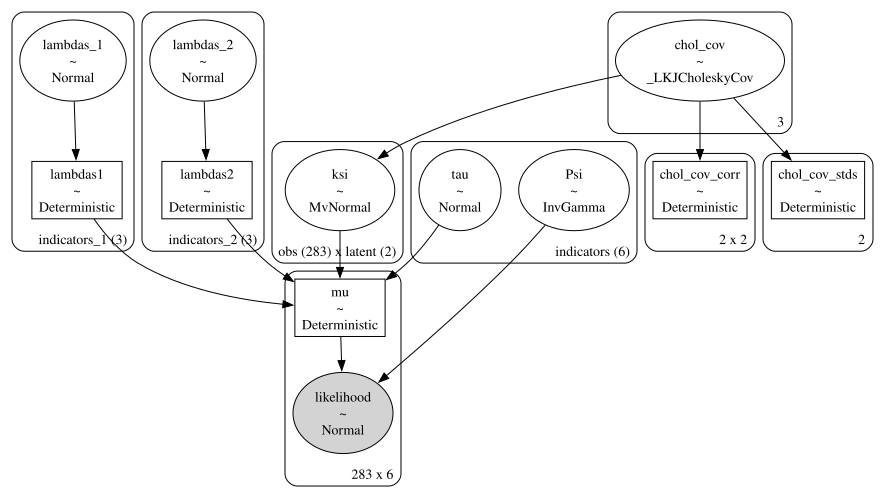

In [6]:
# Set up coordinates for appropriate indexing of latent factors
coords = {
    "obs": list(range(len(df))),
    "indicators": ["se_social_p1", "se_social_p2", "se_social_p3", "ls_p1", "ls_p2", "ls_p3"],
    "indicators_1": ["se_social_p1", "se_social_p2", "se_social_p3"],
    "indicators_2": ["ls_p1", "ls_p2", "ls_p3"],
    "latent": ["SE_SOC", "LS"],
}


obs_idx = list(range(len(df)))
with pm.Model(coords=coords) as model:

    # Set up Factor Loadings
    lambdas_ = pm.Normal("lambdas_1", 1, 10, dims=("indicators_1"))
    # Force a fixed scale on the factor loadings for factor 1
    lambdas_1 = pm.Deterministic(
        "lambdas1", pt.set_subtensor(lambdas_[0], 1), dims=("indicators_1")
    )
    lambdas_ = pm.Normal("lambdas_2", 1, 10, dims=("indicators_2"))
    # Force a fixed scale on the factor loadings for factor 2
    lambdas_2 = pm.Deterministic(
        "lambdas2", pt.set_subtensor(lambdas_[0], 1), dims=("indicators_2")
    )

    # Specify covariance structure between latent factors
    kappa = 0
    sd_dist = pm.Exponential.dist(1.0, shape=2)
    chol, _, _ = pm.LKJCholeskyCov("chol_cov", n=2, eta=2, sd_dist=sd_dist, compute_corr=True)
    ksi = pm.MvNormal("ksi", kappa, chol=chol, dims=("obs", "latent"))

    # Construct Pseudo Observation matrix based on Factor Loadings
    tau = pm.Normal("tau", 3, 10, dims="indicators")
    m1 = tau[0] + ksi[obs_idx, 0] * lambdas_1[0]
    m2 = tau[1] + ksi[obs_idx, 0] * lambdas_1[1]
    m3 = tau[2] + ksi[obs_idx, 0] * lambdas_1[2]
    m4 = tau[3] + ksi[obs_idx, 1] * lambdas_2[0]
    m5 = tau[4] + ksi[obs_idx, 1] * lambdas_2[1]
    m6 = tau[5] + ksi[obs_idx, 1] * lambdas_2[2]

    mu = pm.Deterministic("mu", pm.math.stack([m1, m2, m3, m4, m5, m6]).T)

    ## Error Terms
    Psi = pm.InverseGamma("Psi", 5, 10, dims="indicators")

    # Likelihood
    _ = pm.Normal(
        "likelihood",
        mu,
        Psi,
        observed=df[
            ["se_social_p1", "se_social_p2", "se_social_p3", "ls_p1", "ls_p2", "ls_p3"]
        ].values,
    )

    idata = pm.sample(
        nuts_sampler="numpyro", target_accept=0.95, idata_kwargs={"log_likelihood": True}
    )
    idata.extend(pm.sample_posterior_predictive(idata))

pm.model_to_graphviz(model)

Here the model structure and dependency graph becomes a little clearer. Our likelihood term models a outcome matrix of 283x6 observations i.e. the survey responses for 6 questions. These survey responses are modelled as regression-like outcomes from a multivariate normal $Ksi$ with a prior correlation structure between the latent constructs. We then specify how each of the outcome measures is a function of one of the latent factor modified by the appropriate factor loading `lambda`.

### Meausurement Model Structure

We can now see how the covariance structure among the latent constructs is integral piece of the overarching model design which is fed forward into our pseudo regression components and weighted with the respective lambda terms. 

In [7]:
az.summary(idata, var_names=["lambdas1", "lambdas2"])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
lambdas1[se_social_p1],1.000,0.000,1.000,1.000,0.000,0.000,4000.0,4000.0,NaN
lambdas1[se_social_p2],0.978,0.061,0.863,1.090,0.002,0.001,851.0,1673.0,1.0
lambdas1[se_social_p3],0.947,0.075,0.814,1.093,0.002,0.001,1456.0,2049.0,1.0
lambdas2[ls_p1],1.000,0.000,1.000,1.000,0.000,0.000,4000.0,4000.0,NaN
lambdas2[ls_p2],0.810,0.080,0.670,0.971,0.003,0.002,779.0,1068.0,1.0
lambdas2[ls_p3],0.860,0.091,0.686,1.023,0.003,0.002,1133.0,1954.0,1.0


These factor loadings are generally important to interpret in terms of construct validity. Because we've specified one of the indicator variables to be fixed at 1, the other indicators which load on that factor should have a loading coefficient in broadly the same scale as the fixed point indicator that defines the construct scale. We're looking for consistency among the loadings to assess whether the indicators are reliable measures of the construct i.e. if the indicator loadings deviates too far from unit 1 then there is an argument to be made that these indicators don't belong in the same factor construct. 

In [8]:
idata

Inference data with groups:
	> posterior
	> posterior_predictive
	> log_likelihood
	> sample_stats
	> observed_data

Let's plot the trace diagnostics to validate the sampler has converged well to the posterior distribution. 

/Users/nathanielforde/mambaforge/envs/pymc_causal/lib/python3.11/site-packages/arviz/stats/density_utils.py:487: UserWarning: Your data appears to have a single value or no finite values
  warnings.warn("Your data appears to have a single value or no finite values")
/Users/nathanielforde/mambaforge/envs/pymc_causal/lib/python3.11/site-packages/arviz/stats/density_utils.py:487: UserWarning: Your data appears to have a single value or no finite values
  warnings.warn("Your data appears to have a single value or no finite values")


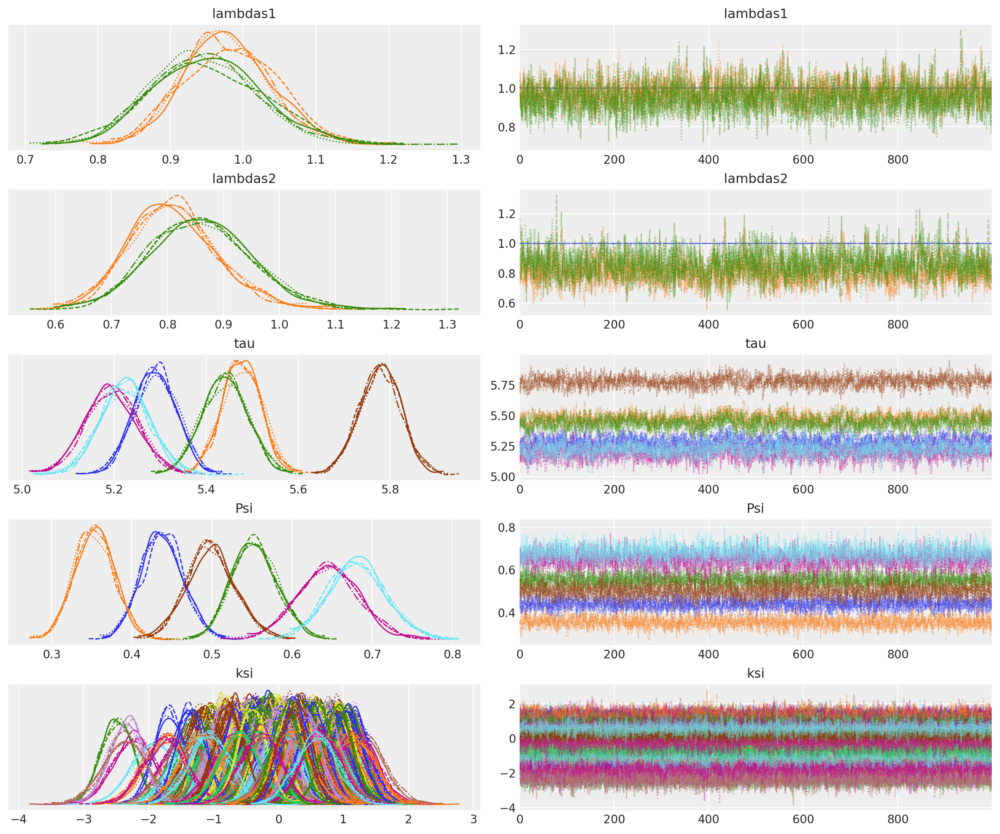

In [9]:
az.plot_trace(idata, var_names=["lambdas1", "lambdas2", "tau", "Psi", "ksi"]);

### Sampling the Latent Constructs

One thing to highlight in particular about the Bayesian manner of fitting CFA and SEM models is that we now have access to the posterior distribution of the latent quantities. These samples can offer insight into particular individuals in our survey that is harder to glean from the multivariate presentation of the manifest variables. 

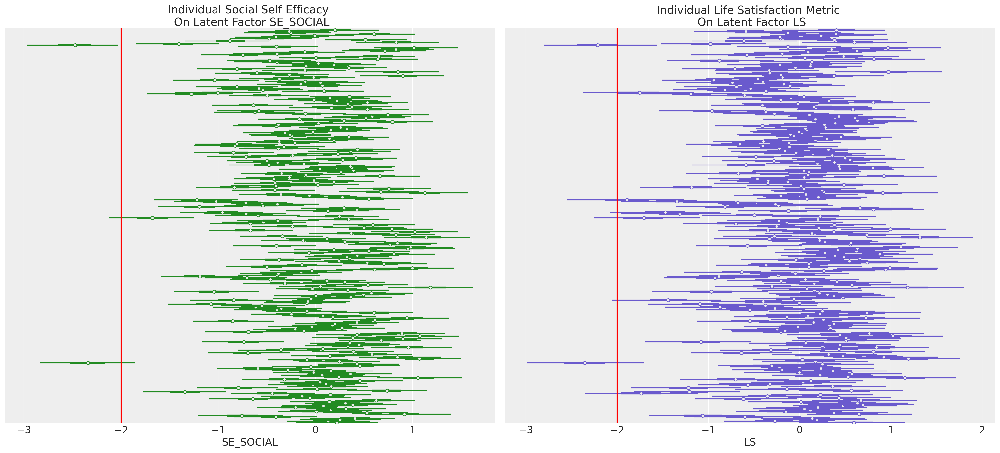

In [10]:
fig, axs = plt.subplots(1, 2, figsize=(20, 9))
axs = axs.flatten()
ax1 = axs[0]
ax2 = axs[1]
az.plot_forest(
    idata,
    var_names=["ksi"],
    combined=True,
    ax=ax1,
    colors="forestgreen",
    coords={"latent": ["SE_SOC"]},
)
az.plot_forest(
    idata, var_names=["ksi"], combined=True, ax=ax2, colors="slateblue", coords={"latent": ["LS"]}
)
ax1.set_yticklabels([])
ax1.set_xlabel("SE_SOCIAL")
ax2.set_yticklabels([])
ax2.set_xlabel("LS")
ax1.axvline(-2, color="red")
ax2.axvline(-2, color="red")
ax1.set_title("Individual Social Self Efficacy \n On Latent Factor SE_SOCIAL")
ax2.set_title("Individual Life Satisfaction Metric \n On Latent Factor LS")
plt.show();

In this way we can identify and zero-in on individuals that appear to be outliers on one or more of the latent constructs.

### Posterior Predictive Checks

As in more traditional Bayesian modelling, a core component of model evaluation is the assessment of the posterior predictive distribution i.e. the implied outcome distribution. Here too we can pull out draws against each of the indicator variables to assess for coherence and adequacy. 

/var/folders/__/ng_3_9pn1f11ftyml_qr69vh0000gn/T/ipykernel_65351/3491944590.py:25: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


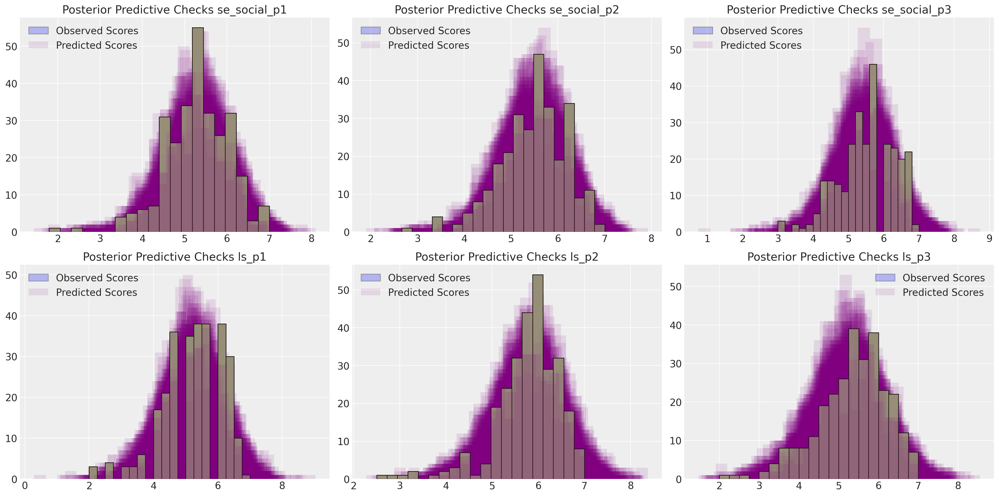

In [11]:
def make_ppc(
    idata,
    samples=100,
    drivers=["se_social_p1", "se_social_p2", "se_social_p3", "ls_p1", "ls_p2", "ls_p3"],
    dims=(2, 3),
):
    fig, axs = plt.subplots(dims[0], dims[1], figsize=(20, 10))
    axs = axs.flatten()
    for i in range(len(drivers)):
        for j in range(samples):
            temp = az.extract(idata["posterior_predictive"].sel({"likelihood_dim_3": i}))[
                "likelihood"
            ].values[:, j]
            temp = pd.DataFrame(temp, columns=["likelihood"])
            if j == 0:
                axs[i].hist(df[drivers[i]], alpha=0.3, ec="black", bins=20, label="Observed Scores")
                axs[i].hist(
                    temp["likelihood"], color="purple", alpha=0.1, bins=20, label="Predicted Scores"
                )
            else:
                axs[i].hist(df[drivers[i]], alpha=0.3, ec="black", bins=20)
                axs[i].hist(temp["likelihood"], color="purple", alpha=0.1, bins=20)
            axs[i].set_title(f"Posterior Predictive Checks {drivers[i]}")
            axs[i].legend()
    plt.tight_layout()
    plt.show()


make_ppc(idata)
del idata

Which shows a relatively sound recovery of the observed data. 

### Intermediate Cross-Loading Model

The idea of a measurment model is maybe a little opaque when we only see models that fit well. Instead we want to briefly show how an in-apt measurement model gets reflected in the estimated parameters for the factor loadings. Here we specify a measurement model which attempts to couple the `se_social` and `sup_parents` indicators and bundle them into the same factor. 

In [12]:
coords = {
    "obs": list(range(len(df))),
    "indicators": [
        "se_social_p1",
        "se_social_p2",
        "se_social_p3",
        "sup_parents_p1",
        "sup_parents_p2",
        "sup_parents_p3",
        "ls_p1",
        "ls_p2",
        "ls_p3",
    ],
    ## Attempt Cross-Loading of two metric types on one factor
    "indicators_1": [
        "se_social_p1",
        "se_social_p2",
        "se_social_p3",
        "sup_parents_p1",
        "sup_parents_p2",
        "sup_parents_p3",
    ],
    "indicators_2": ["ls_p1", "ls_p2", "ls_p3"],
    "latent": ["SE_SOC", "LS"],
}


obs_idx = list(range(len(df)))
with pm.Model(coords=coords) as model:

    Psi = pm.InverseGamma("Psi", 5, 10, dims="indicators")
    lambdas_ = pm.Normal("lambdas_1", 1, 10, dims=("indicators_1"))
    # Force a fixed scale on the factor loadings for factor 1
    lambdas_1 = pm.Deterministic(
        "lambdas1", pt.set_subtensor(lambdas_[0], 1), dims=("indicators_1")
    )
    lambdas_ = pm.Normal("lambdas_2", 1, 10, dims=("indicators_2"))
    # Force a fixed scale on the factor loadings for factor 2
    lambdas_2 = pm.Deterministic(
        "lambdas2", pt.set_subtensor(lambdas_[0], 1), dims=("indicators_2")
    )
    tau = pm.Normal("tau", 3, 10, dims="indicators")
    # Specify covariance structure between latent factors
    kappa = 0
    sd_dist = pm.Exponential.dist(1.0, shape=2)
    chol, _, _ = pm.LKJCholeskyCov("chol_cov", n=2, eta=2, sd_dist=sd_dist, compute_corr=True)
    ksi = pm.MvNormal("ksi", kappa, chol=chol, dims=("obs", "latent"))

    # Construct Observation matrix
    m1 = tau[0] + ksi[obs_idx, 0] * lambdas_1[0]
    m2 = tau[1] + ksi[obs_idx, 0] * lambdas_1[1]
    m3 = tau[2] + ksi[obs_idx, 0] * lambdas_1[2]
    m4 = tau[3] + ksi[obs_idx, 0] * lambdas_1[3]
    m5 = tau[4] + ksi[obs_idx, 0] * lambdas_1[4]
    m6 = tau[5] + ksi[obs_idx, 0] * lambdas_1[5]
    m7 = tau[3] + ksi[obs_idx, 1] * lambdas_2[0]
    m8 = tau[4] + ksi[obs_idx, 1] * lambdas_2[1]
    m9 = tau[5] + ksi[obs_idx, 1] * lambdas_2[2]

    mu = pm.Deterministic("mu", pm.math.stack([m1, m2, m3, m4, m5, m6, m7, m8, m9]).T)
    _ = pm.Normal(
        "likelihood",
        mu,
        Psi,
        observed=df[
            [
                "se_social_p1",
                "se_social_p2",
                "se_social_p3",
                "sup_parents_p1",
                "sup_parents_p2",
                "sup_parents_p3",
                "ls_p1",
                "ls_p2",
                "ls_p3",
            ]
        ].values,
    )

    idata = pm.sample(
        draws=10000,
        nuts_sampler="numpyro",
        target_accept=0.99,
        idata_kwargs={"log_likelihood": True},
        random_seed=114,
    )
    idata.extend(pm.sample_posterior_predictive(idata))

Compiling...
Compilation time = 0:00:01.763104
Sampling...


  0%|          | 0/11000 [00:00<?, ?it/s]

  0%|          | 0/11000 [00:00<?, ?it/s]

  0%|          | 0/11000 [00:00<?, ?it/s]

  0%|          | 0/11000 [00:00<?, ?it/s]

Sampling time = 0:00:25.645958
Transforming variables...
Transformation time = 0:00:00.774116
Computing Log Likelihood...
Log Likelihood time = 0:00:00.551075
Sampling: [likelihood]


Again our model samples well but the parameter estimates suggest that there is some inconsistency between the scale on which we're trying to force both sets of metrics. 

In [13]:
az.summary(idata, var_names=["lambdas1", "lambdas2"])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
lambdas1[se_social_p1],1.000,0.000,1.000,1.000,0.000,0.000,40000.0,40000.0,NaN
lambdas1[se_social_p2],0.928,0.128,0.694,1.172,0.002,0.002,3090.0,5423.0,1.0
lambdas1[se_social_p3],0.854,0.139,0.598,1.121,0.002,0.002,4600.0,8366.0,1.0
lambdas1[sup_parents_p1],2.321,0.289,1.807,2.867,0.008,0.005,1421.0,2736.0,1.0
lambdas1[sup_parents_p2],2.171,0.278,1.684,2.699,0.008,0.005,1333.0,2592.0,1.0
lambdas1[sup_parents_p3],2.334,0.290,1.832,2.898,0.008,0.005,1442.0,2795.0,1.0
lambdas2[ls_p1],1.000,0.000,1.000,1.000,0.000,0.000,40000.0,40000.0,NaN
lambdas2[ls_p2],0.777,0.105,0.589,0.975,0.002,0.002,2530.0,4296.0,1.0
lambdas2[ls_p3],1.080,0.135,0.840,1.335,0.003,0.002,2271.0,3902.0,1.0


This is similarly refected in the diagnostic energy plots here too. 

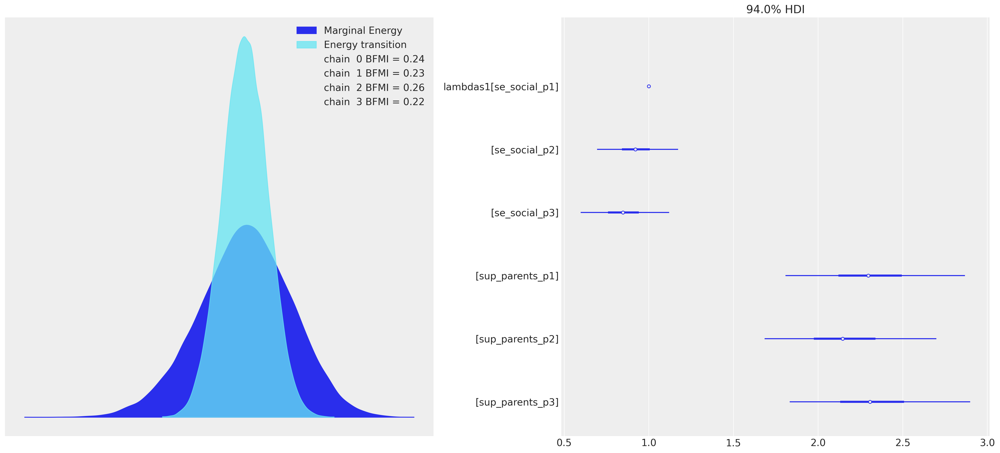

In [14]:
fig, axs = plt.subplots(1, 2, figsize=(20, 9))
axs = axs.flatten()
az.plot_energy(idata, ax=axs[0])
az.plot_forest(idata, var_names=["lambdas1"], combined=True, ax=axs[1]);

This hints at a variety of measurement model misspecification and should force us back to the drawing board. An appropriate measurement model maps the indicator variables to a consistently defined latent construct that plausibly reflects aspects of the realised indicator metrics. 

## Full Measurement Model

With this in mind we'll now specify a full measurement that maps each of our thematically similar indicator metrics to an indicidual latent construct. This mandates the postulation of 5 distinct constructs where we only admit three metrics load on each construct. The choice of which metric loads on the latent construct is determined in our case by the constructs each measure is intended to measure. In the typical `lavaan` syntax we might write the model as follows: 


```
SUP_Parents =~ sup_parents_p1 + sup_parents_p2 + sup_parents_p3
SUP_Friends =~ sup_friends_p1 + sup_friends_p2 + sup_friends_p3
SE_Academic =~ se_acad_p1 + se_acad_p2 + se_acad_p3
SE_Social =~ se_social_p1 + se_social_p2 + se_social_p3
LS  =~ ls_p1 + ls_p2 + ls_p3
```

where the `=~` syntax denotes "is measured by" relation. It is the manner in which each of these indicator variables is determined by the latent construct that we seek to estimate when fitting a measurement model of this type. 


In [15]:
drivers = [
    "se_acad_p1",
    "se_acad_p2",
    "se_acad_p3",
    "se_social_p1",
    "se_social_p2",
    "se_social_p3",
    "sup_friends_p1",
    "sup_friends_p2",
    "sup_friends_p3",
    "sup_parents_p1",
    "sup_parents_p2",
    "sup_parents_p3",
    "ls_p1",
    "ls_p2",
    "ls_p3",
]

coords = {
    "obs": list(range(len(df))),
    "indicators": drivers,
    "indicators_1": ["se_acad_p1", "se_acad_p2", "se_acad_p3"],
    "indicators_2": ["se_social_p1", "se_social_p2", "se_social_p3"],
    "indicators_3": ["sup_friends_p1", "sup_friends_p2", "sup_friends_p3"],
    "indicators_4": ["sup_parents_p1", "sup_parents_p2", "sup_parents_p3"],
    "indicators_5": ["ls_p1", "ls_p2", "ls_p3"],
    "latent": ["SE_ACAD", "SE_SOCIAL", "SUP_F", "SUP_P", "LS"],
    "latent1": ["SE_ACAD", "SE_SOCIAL", "SUP_F", "SUP_P", "LS"],
}

obs_idx = list(range(len(df)))
with pm.Model(coords=coords) as model:

    Psi = pm.InverseGamma("Psi", 5, 10, dims="indicators")
    lambdas_ = pm.Normal("lambdas_1", 1, 10, dims=("indicators_1"))
    lambdas_1 = pm.Deterministic(
        "lambdas1", pt.set_subtensor(lambdas_[0], 1), dims=("indicators_1")
    )
    lambdas_ = pm.Normal("lambdas_2", 1, 10, dims=("indicators_2"))
    lambdas_2 = pm.Deterministic(
        "lambdas2", pt.set_subtensor(lambdas_[0], 1), dims=("indicators_2")
    )
    lambdas_ = pm.Normal("lambdas_3", 1, 10, dims=("indicators_3"))
    lambdas_3 = pm.Deterministic(
        "lambdas3", pt.set_subtensor(lambdas_[0], 1), dims=("indicators_3")
    )
    lambdas_ = pm.Normal("lambdas_4", 1, 10, dims=("indicators_4"))
    lambdas_4 = pm.Deterministic(
        "lambdas4", pt.set_subtensor(lambdas_[0], 1), dims=("indicators_4")
    )
    lambdas_ = pm.Normal("lambdas_5", 1, 10, dims=("indicators_5"))
    lambdas_5 = pm.Deterministic(
        "lambdas5", pt.set_subtensor(lambdas_[0], 1), dims=("indicators_5")
    )
    tau = pm.Normal("tau", 3, 10, dims="indicators")
    kappa = 0
    sd_dist = pm.Exponential.dist(1.0, shape=5)
    chol, _, _ = pm.LKJCholeskyCov("chol_cov", n=5, eta=2, sd_dist=sd_dist, compute_corr=True)
    cov = pm.Deterministic("cov", chol.dot(chol.T), dims=("latent", "latent1"))
    ksi = pm.MvNormal("ksi", kappa, chol=chol, dims=("obs", "latent"))

    m0 = tau[0] + ksi[obs_idx, 0] * lambdas_1[0]
    m1 = tau[1] + ksi[obs_idx, 0] * lambdas_1[1]
    m2 = tau[2] + ksi[obs_idx, 0] * lambdas_1[2]
    m3 = tau[3] + ksi[obs_idx, 1] * lambdas_2[0]
    m4 = tau[4] + ksi[obs_idx, 1] * lambdas_2[1]
    m5 = tau[5] + ksi[obs_idx, 1] * lambdas_2[2]
    m6 = tau[6] + ksi[obs_idx, 2] * lambdas_3[0]
    m7 = tau[7] + ksi[obs_idx, 2] * lambdas_3[1]
    m8 = tau[8] + ksi[obs_idx, 2] * lambdas_3[2]
    m9 = tau[9] + ksi[obs_idx, 3] * lambdas_4[0]
    m10 = tau[10] + ksi[obs_idx, 3] * lambdas_4[1]
    m11 = tau[11] + ksi[obs_idx, 3] * lambdas_4[2]
    m12 = tau[12] + ksi[obs_idx, 4] * lambdas_5[0]
    m13 = tau[13] + ksi[obs_idx, 4] * lambdas_5[1]
    m14 = tau[14] + ksi[obs_idx, 4] * lambdas_5[2]

    mu = pm.Deterministic(
        "mu", pm.math.stack([m0, m1, m2, m3, m4, m5, m6, m7, m8, m9, m10, m11, m12, m13, m14]).T
    )
    _ = pm.Normal("likelihood", mu, Psi, observed=df[drivers].values)

    idata_mm = pm.sample(
        draws=10000,
        nuts_sampler="numpyro",
        target_accept=0.98,
        tune=1000,
        idata_kwargs={"log_likelihood": True},
        random_seed=100,
    )
    idata_mm.extend(pm.sample_posterior_predictive(idata_mm))

Compiling...
Compilation time = 0:00:02.405489
Sampling...


  0%|          | 0/11000 [00:00<?, ?it/s]

  0%|          | 0/11000 [00:00<?, ?it/s]

  0%|          | 0/11000 [00:00<?, ?it/s]

  0%|          | 0/11000 [00:00<?, ?it/s]

Sampling time = 0:04:17.111887
Transforming variables...
Transformation time = 0:00:04.106305
Computing Log Likelihood...
Log Likelihood time = 0:00:02.326951
Sampling: [likelihood]


### Model Evaluation Checks

We can see quickly here how this factor structure seems to sample better and retains a consistency of scale. 

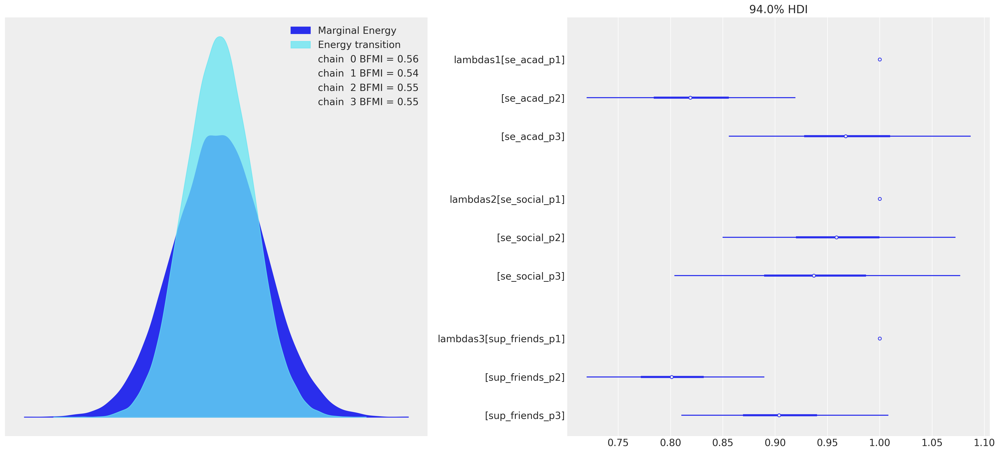

In [16]:
fig, axs = plt.subplots(1, 2, figsize=(20, 9))
axs = axs.flatten()
az.plot_energy(idata_mm, ax=axs[0])
az.plot_forest(idata_mm, var_names=["lambdas1", "lambdas2", "lambdas3"], combined=True, ax=axs[1]);

We can also pull out the more typical patterns of model evaluation by assessing the fit between the posterior predicted covariances and the sample covariances. This is a sanity check to assess local model fit statistics. The below code iterates over draws from the posterior predictive distribution and calculates the covariance or correlation matrix on eah draw, we calculate the residuals on each draw between each of the covariances and then average across the draws. 

In [17]:
def get_posterior_resids(idata, samples=100, metric="cov"):
    resids = []
    for i in range(100):
        if metric == "cov":
            model_cov = pd.DataFrame(
                az.extract(idata["posterior_predictive"])["likelihood"][:, :, i]
            ).cov()
            obs_cov = df[drivers].cov()
        else:
            model_cov = pd.DataFrame(
                az.extract(idata["posterior_predictive"])["likelihood"][:, :, i]
            ).corr()
            obs_cov = df[drivers].corr()
        model_cov.index = obs_cov.index
        model_cov.columns = obs_cov.columns
        residuals = model_cov - obs_cov
        resids.append(residuals.values.flatten())

    residuals_posterior = pd.DataFrame(pd.DataFrame(resids).mean().values.reshape(15, 15))
    residuals_posterior.index = obs_cov.index
    residuals_posterior.columns = obs_cov.index
    return residuals_posterior


residuals_posterior_cov = get_posterior_resids(idata_mm, 2500)
residuals_posterior_corr = get_posterior_resids(idata_mm, 2500, metric="corr")

These tables lend themselves to nice plots where we can highlight the deviation from the sample covariance and correlation statistics. 

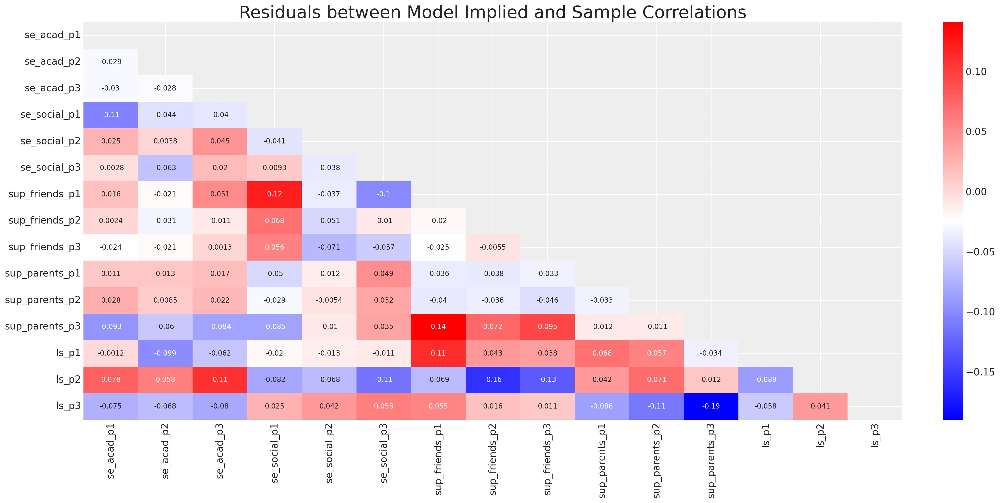

In [18]:
fig, ax = plt.subplots(figsize=(20, 10))
mask = np.triu(np.ones_like(residuals_posterior_corr, dtype=bool))
ax = sns.heatmap(residuals_posterior_corr, annot=True, cmap="bwr", mask=mask)
ax.set_title("Residuals between Model Implied and Sample Correlations", fontsize=25);

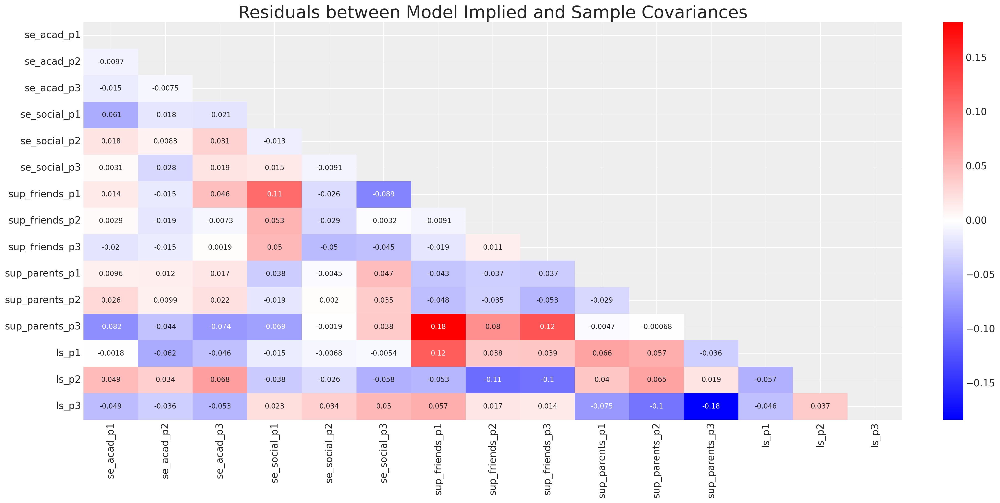

In [19]:
fig, ax = plt.subplots(figsize=(20, 10))
ax = sns.heatmap(residuals_posterior_cov, annot=True, cmap="bwr", mask=mask)
ax.set_title("Residuals between Model Implied and Sample Covariances", fontsize=25);

However the focus on recovering a fit to such summary statistics is less compelling and more indirect than recovering the observed data itself. We can also do more contemporary Bayesian posterior predictive checks as we pull out the predictive posterior distribution for each of the observed metrics. 

/var/folders/__/ng_3_9pn1f11ftyml_qr69vh0000gn/T/ipykernel_65351/3491944590.py:25: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


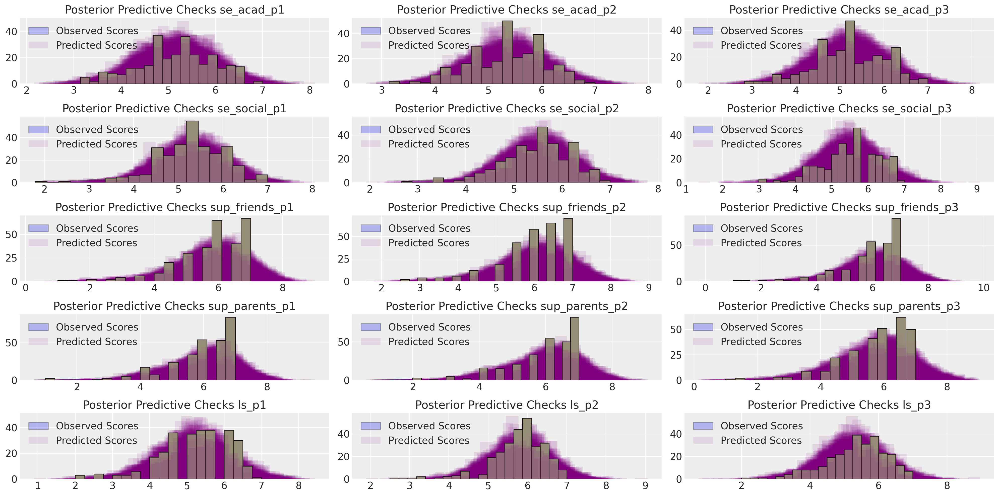

In [20]:
make_ppc(idata_mm, 100, drivers=residuals_posterior_cov.columns, dims=(5, 3));

### Model Analysis

We're not just interested in recovering the observed data patterns we also want a way of pulling out the inferences relating to the latent constructs. For instance we can pull out the factor loadings and calculate measures of variance accounted for by each of the indicator variables in this factor system and for the factors themselves. 

In [21]:
def make_factor_loadings_df(idata):
    factor_loadings = pd.DataFrame(
        az.summary(
            idata_mm, var_names=["lambdas1", "lambdas2", "lambdas3", "lambdas4", "lambdas5"]
        )["mean"]
    ).reset_index()
    factor_loadings["factor"] = factor_loadings["index"].str.split("[", expand=True)[0]
    factor_loadings.columns = ["factor_loading", "factor_loading_weight", "factor"]
    factor_loadings["factor_loading_weight_sq"] = factor_loadings["factor_loading_weight"] ** 2
    factor_loadings["sum_sq_loadings"] = factor_loadings.groupby("factor")[
        "factor_loading_weight_sq"
    ].transform(sum)
    factor_loadings["error_variances"] = az.summary(idata_mm, var_names=["Psi"])["mean"].values
    factor_loadings["total_indicator_variance"] = (
        factor_loadings["factor_loading_weight_sq"] + factor_loadings["error_variances"]
    )
    factor_loadings["total_variance"] = factor_loadings["total_indicator_variance"].sum()
    factor_loadings["indicator_explained_variance"] = (
        factor_loadings["factor_loading_weight_sq"] / factor_loadings["total_variance"]
    )
    factor_loadings["factor_explained_variance"] = (
        factor_loadings["sum_sq_loadings"] / factor_loadings["total_variance"]
    )
    num_cols = [c for c in factor_loadings.columns if not c in ["factor_loading", "factor"]]
    return factor_loadings


pd.set_option("display.max_colwidth", 15)
factor_loadings = make_factor_loadings_df(idata_mm)
num_cols = [c for c in factor_loadings.columns if not c in ["factor_loading", "factor"]]
factor_loadings.style.format("{:.2f}", subset=num_cols).background_gradient(
    axis=0, subset=["indicator_explained_variance", "factor_explained_variance"]
)

/var/folders/__/ng_3_9pn1f11ftyml_qr69vh0000gn/T/ipykernel_65351/4267176426.py:12: FutureWarning: The provided callable <built-in function sum> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
  ].transform(sum)


,factor_loading,factor_loading_weight,factor,factor_loading_weight_sq,sum_sq_loadings,error_variances,total_indicator_variance,total_variance,indicator_explained_variance,factor_explained_variance
0,lambdas1[se_acad_p1],1.00,lambdas1,1.00,2.61,0.41,1.41,21.47,0.05,0.12
1,lambdas1[se_acad_p2],0.82,lambdas1,0.67,2.61,0.41,1.09,21.47,0.03,0.12
2,lambdas1[se_acad_p3],0.97,lambdas1,0.94,2.61,0.47,1.41,21.47,0.04,0.12
3,lambdas2[se_social_p1],1.00,lambdas2,1.00,2.81,0.43,1.43,21.47,0.05,0.13
4,lambdas2[se_social_p2],0.96,lambdas2,0.92,2.81,0.36,1.29,21.47,0.04,0.13
5,lambdas2[se_social_p3],0.94,lambdas2,0.88,2.81,0.55,1.43,21.47,0.04,0.13
6,lambdas3[sup_friends_p1],1.00,lambdas3,1.00,2.46,0.52,1.52,21.47,0.05,0.11
7,lambdas3[sup_friends_p2],0.80,lambdas3,0.64,2.46,0.51,1.15,21.47,0.03,0.11
8,lambdas3[sup_friends_p3],0.91,lambdas3,0.82,2.46,0.62,1.44,21.47,0.04,0.11
9,lambdas4[sup_parents_p1],1.00,lambdas4,1.00,3.11,0.55,1.55,21.47,0.05,0.14


We can pull out and plot the ordered weightings as a kind of feature importance plot.

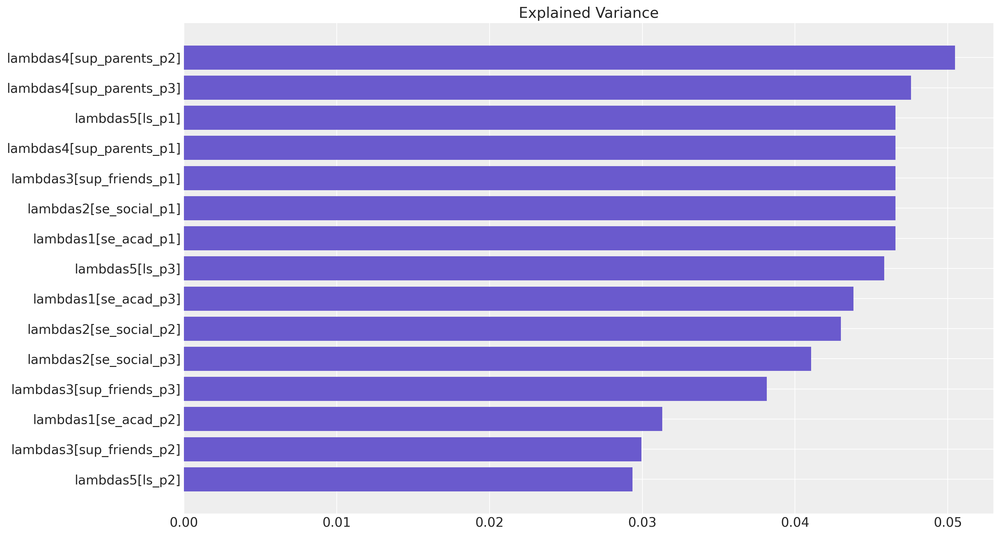

In [22]:
fig, ax = plt.subplots(figsize=(15, 8))
temp = factor_loadings[["factor_loading", "indicator_explained_variance"]].sort_values(
    by="indicator_explained_variance"
)
ax.barh(
    temp["factor_loading"], temp["indicator_explained_variance"], align="center", color="slateblue"
)
ax.set_title("Explained Variance");

The goal of this kind of view isn't necessarily to find useful features as in the machine learning context, but to help understand the nature of the variation in our system. We can also pull out covariances and correlations among the latent factors

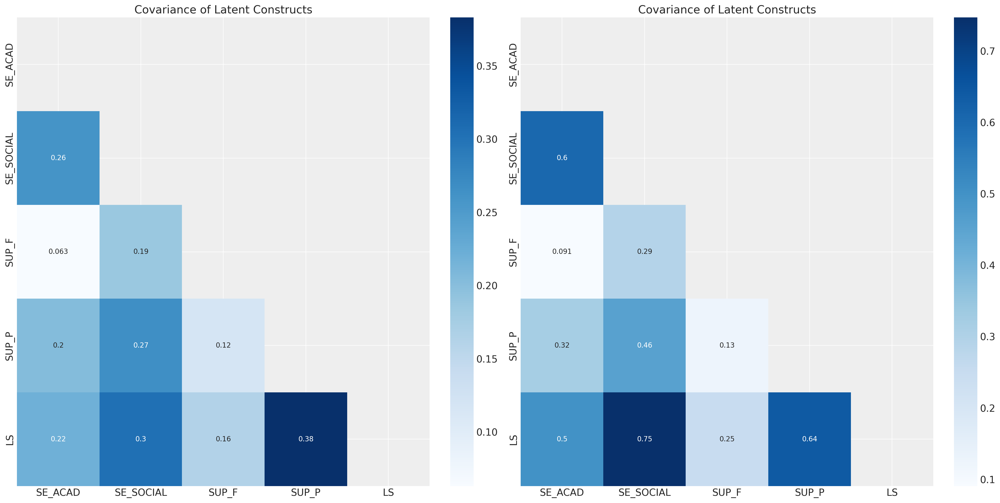

In [23]:
cov_df = pd.DataFrame(az.extract(idata_mm["posterior"])["cov"].mean(axis=2))
cov_df.index = ["SE_ACAD", "SE_SOCIAL", "SUP_F", "SUP_P", "LS"]
cov_df.columns = ["SE_ACAD", "SE_SOCIAL", "SUP_F", "SUP_P", "LS"]

correlation_df = pd.DataFrame(az.extract(idata_mm["posterior"])["chol_cov_corr"].mean(axis=2))
correlation_df.index = ["SE_ACAD", "SE_SOCIAL", "SUP_F", "SUP_P", "LS"]
correlation_df.columns = ["SE_ACAD", "SE_SOCIAL", "SUP_F", "SUP_P", "LS"]

fig, axs = plt.subplots(1, 2, figsize=(20, 10))
axs = axs.flatten()
mask = np.triu(np.ones_like(cov_df, dtype=bool))
sns.heatmap(cov_df, annot=True, cmap="Blues", ax=axs[0], mask=mask)
axs[0].set_title("Covariance of Latent Constructs")
axs[1].set_title("Covariance of Latent Constructs")
sns.heatmap(correlation_df, annot=True, cmap="Blues", ax=axs[1], mask=mask);

Which highlights the strong relationships between life-satisfaction `LS` construct, parental support `SUP_P` and social self-efficacy `SE_SOCIAL`. We can observe these patterns in the draws of our latent constructs too

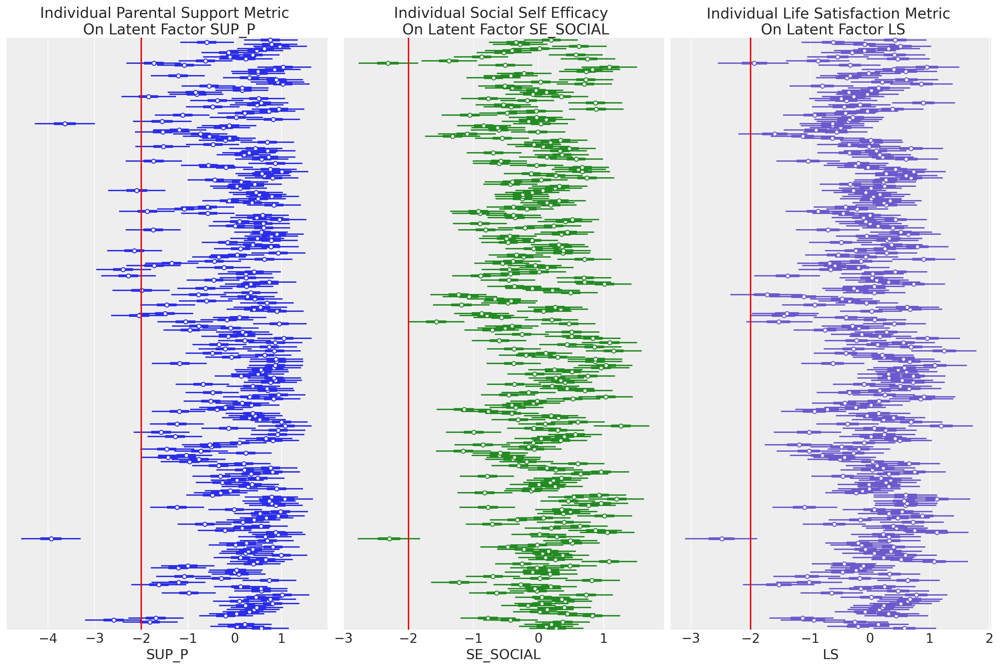

In [24]:
fig, axs = plt.subplots(1, 3, figsize=(15, 10))
axs = axs.flatten()
ax = axs[0]
ax1 = axs[1]
ax2 = axs[2]
az.plot_forest(idata_mm, var_names=["ksi"], combined=True, ax=ax, coords={"latent": ["SUP_P"]})
az.plot_forest(
    idata_mm,
    var_names=["ksi"],
    combined=True,
    ax=ax1,
    colors="forestgreen",
    coords={"latent": ["SE_SOCIAL"]},
)
az.plot_forest(
    idata_mm,
    var_names=["ksi"],
    combined=True,
    ax=ax2,
    colors="slateblue",
    coords={"latent": ["LS"]},
)
ax.set_yticklabels([])
ax.set_xlabel("SUP_P")
ax1.set_yticklabels([])
ax1.set_xlabel("SE_SOCIAL")
ax2.set_yticklabels([])
ax2.set_xlabel("LS")
ax.axvline(-2, color="red")
ax1.axvline(-2, color="red")
ax2.axvline(-2, color="red")
ax.set_title("Individual Parental Support Metric \n On Latent Factor SUP_P")
ax1.set_title("Individual Social Self Efficacy \n On Latent Factor SE_SOCIAL")
ax2.set_title("Individual Life Satisfaction Metric \n On Latent Factor LS")
plt.show();

It's worth highlighting here the cohort on the top left of the `SUP_P` graph which have low parental support scores, seem to have less severe `SE_SOCIAL` scores. This combination seems to result in fairly standard `LS` scores suggesting some kind of moderated relationship. 

## Bayesian Structural Equation Models

We've now seen how measurement models help us understand the relationships between disparate indicator variables in a kind of crude way. We have postulated a system of latent factors and derived the correlations between these factors to help us understand the strength of relationships between the broader constructs of interest. This is kind a special case of a structural equation models. In the SEM tradition we're interested in figuring out aspects of the structural relations between variables that means want to posit dependence and independence relationship to interrogate our beliefs about influence flows through the system. 

For our data set we can postulate the following chain of dependencies

![Candidate Structural Model](structural_model_sem.png)

This picture introduces specific claims of dependence and the question then becomes how to model these patterns? In the next section we'll build on the structures of the basic measurement model to articulate these chain of dependence as functional equations of the "root" constructs. This allows to evaluate the same questions of model adequacy as before, but additionally we can now phrase questions about direct and indirect relationships between the latent constructs. In particular, since our focus is on what drives life-satisfaction, we can ask our model about the mediated effects of parental and peer support. 

### Model Complexity and Bayesian Sensitivity Analysis

These models are already complicated and now we're adding a bunch of new parameters and structure to the model. Each of the parameters is equipped with a prior that shapes the implications of the model specification. This is a hugely expressive framework where we can encode a large variety of dependencies and correlations. With this freedom to structure our inferential model we need to be careful to assess the robustness of our inferences. As such we will here perform a quick sensitivity analysis to show how the central implications of this model vary under differing prior settings. 



In [25]:
drivers = [
    "se_acad_p1",
    "se_acad_p2",
    "se_acad_p3",
    "se_social_p1",
    "se_social_p2",
    "se_social_p3",
    "sup_friends_p1",
    "sup_friends_p2",
    "sup_friends_p3",
    "sup_parents_p1",
    "sup_parents_p2",
    "sup_parents_p3",
    "ls_p1",
    "ls_p2",
    "ls_p3",
]


def make_indirect_sem(priors):

    coords = {
        "obs": list(range(len(df))),
        "indicators": drivers,
        "indicators_1": ["se_acad_p1", "se_acad_p2", "se_acad_p3"],
        "indicators_2": ["se_social_p1", "se_social_p2", "se_social_p3"],
        "indicators_3": ["sup_friends_p1", "sup_friends_p2", "sup_friends_p3"],
        "indicators_4": ["sup_parents_p1", "sup_parents_p2", "sup_parents_p3"],
        "indicators_5": ["ls_p1", "ls_p2", "ls_p3"],
        "latent": ["SUP_F", "SUP_P"],
        "latent1": ["SUP_F", "SUP_P"],
        "latent_regression": ["SUP_F->SE_ACAD", "SUP_P->SE_ACAD", "SUP_F->SE_SOC", "SUP_P->SE_SOC"],
        "regression": ["SE_ACAD", "SE_SOCIAL", "SUP_F", "SUP_P"],
    }

    obs_idx = list(range(len(df)))
    with pm.Model(coords=coords) as model:

        Psi = pm.InverseGamma("Psi", 5, 10, dims="indicators")
        lambdas_ = pm.Normal(
            "lambdas_1", priors["lambda"][0], priors["lambda"][1], dims=("indicators_1")
        )
        lambdas_1 = pm.Deterministic(
            "lambdas1", pt.set_subtensor(lambdas_[0], 1), dims=("indicators_1")
        )
        lambdas_ = pm.Normal(
            "lambdas_2", priors["lambda"][0], priors["lambda"][1], dims=("indicators_2")
        )
        lambdas_2 = pm.Deterministic(
            "lambdas2", pt.set_subtensor(lambdas_[0], 1), dims=("indicators_2")
        )
        lambdas_ = pm.Normal(
            "lambdas_3", priors["lambda"][0], priors["lambda"][1], dims=("indicators_3")
        )
        lambdas_3 = pm.Deterministic(
            "lambdas3", pt.set_subtensor(lambdas_[0], 1), dims=("indicators_3")
        )
        lambdas_ = pm.Normal(
            "lambdas_4", priors["lambda"][0], priors["lambda"][1], dims=("indicators_4")
        )
        lambdas_4 = pm.Deterministic(
            "lambdas4", pt.set_subtensor(lambdas_[0], 1), dims=("indicators_4")
        )
        lambdas_ = pm.Normal(
            "lambdas_5", priors["lambda"][0], priors["lambda"][1], dims=("indicators_5")
        )
        lambdas_5 = pm.Deterministic(
            "lambdas5", pt.set_subtensor(lambdas_[0], 1), dims=("indicators_5")
        )
        tau = pm.Normal("tau", 3, 10, dims="indicators")
        kappa = 0
        sd_dist = pm.Exponential.dist(1.0, shape=2)
        chol, _, _ = pm.LKJCholeskyCov(
            "chol_cov", n=2, eta=priors["eta"], sd_dist=sd_dist, compute_corr=True
        )
        cov = pm.Deterministic("cov", chol.dot(chol.T), dims=("latent", "latent1"))
        ksi = pm.MvNormal("ksi", kappa, chol=chol, dims=("obs", "latent"))

        # Regression Components
        beta_r = pm.Normal("beta_r", 0, priors["beta_r"], dims="latent_regression")
        beta_r2 = pm.Normal("beta_r2", 0, priors["beta_r2"], dims="regression")
        sd_dist1 = pm.Exponential.dist(1.0, shape=2)
        resid_chol, _, _ = pm.LKJCholeskyCov(
            "resid_chol", n=2, eta=1, sd_dist=sd_dist1, compute_corr=True
        )
        _ = pm.Deterministic("resid_cov", chol.dot(chol.T))
        sigmas_resid = pm.MvNormal("sigmas_resid", kappa, chol=resid_chol)

        # SE_ACAD ~ SUP_FRIENDS + SUP_PARENTS
        regression_se_acad = pm.Normal(
            "regr_se_acad",
            beta_r[0] * ksi[obs_idx, 0] + beta_r[1] * ksi[obs_idx, 1],
            sigmas_resid[0],
        )
        # SE_SOCIAL ~ SUP_FRIENDS + SUP_PARENTS

        regression_se_social = pm.Normal(
            "regr_se_social",
            beta_r[2] * ksi[obs_idx, 0] + beta_r[3] * ksi[obs_idx, 1],
            sigmas_resid[1],
        )

        # LS ~ SE_ACAD + SE_SOCIAL + SUP_FRIEND + SUP_PARENTS
        regression = pm.Normal(
            "regr",
            beta_r2[0] * regression_se_acad
            + beta_r2[1] * regression_se_social
            + beta_r2[2] * ksi[obs_idx, 0]
            + beta_r2[3] * ksi[obs_idx, 1],
            1,
        )

        m0 = tau[0] + regression_se_acad * lambdas_1[0]
        m1 = tau[1] + regression_se_acad * lambdas_1[1]
        m2 = tau[2] + regression_se_acad * lambdas_1[2]
        m3 = tau[3] + regression_se_social * lambdas_2[0]
        m4 = tau[4] + regression_se_social * lambdas_2[1]
        m5 = tau[5] + regression_se_social * lambdas_2[2]
        m6 = tau[6] + ksi[obs_idx, 0] * lambdas_3[0]
        m7 = tau[7] + ksi[obs_idx, 0] * lambdas_3[1]
        m8 = tau[8] + ksi[obs_idx, 0] * lambdas_3[2]
        m9 = tau[9] + ksi[obs_idx, 1] * lambdas_4[0]
        m10 = tau[10] + ksi[obs_idx, 1] * lambdas_4[1]
        m11 = tau[11] + ksi[obs_idx, 1] * lambdas_4[2]
        m12 = tau[12] + regression * lambdas_5[0]
        m13 = tau[13] + regression * lambdas_5[1]
        m14 = tau[14] + regression * lambdas_5[2]

        mu = pm.Deterministic(
            "mu", pm.math.stack([m0, m1, m2, m3, m4, m5, m6, m7, m8, m9, m10, m11, m12, m13, m14]).T
        )
        _ = pm.Normal("likelihood", mu, Psi, observed=df[drivers].values)

        idata = pm.sample(
            10_000,
            chains=4,
            nuts_sampler="numpyro",
            target_accept=0.99,
            tune=2000,
            idata_kwargs={"log_likelihood": True},
            random_seed=110,
        )
        idata.extend(pm.sample_posterior_predictive(idata))

        return model, idata


model_sem0, idata_sem0 = make_indirect_sem(
    priors={"eta": 2, "lambda": [1, 1], "beta_r": 0.1, "beta_r2": 0.1}
)
model_sem1, idata_sem1 = make_indirect_sem(
    priors={"eta": 2, "lambda": [1, 1], "beta_r": 0.2, "beta_r2": 0.2}
)
model_sem2, idata_sem2 = make_indirect_sem(
    priors={"eta": 2, "lambda": [1, 1], "beta_r": 0.5, "beta_r2": 0.5}
)

Compiling...
Compilation time = 0:00:11.540758
Sampling...


  0%|          | 0/12000 [00:00<?, ?it/s]

  0%|          | 0/12000 [00:00<?, ?it/s]

  0%|          | 0/12000 [00:00<?, ?it/s]

  0%|          | 0/12000 [00:00<?, ?it/s]

Sampling time = 0:01:07.149328
Transforming variables...
Transformation time = 0:00:03.451598
Computing Log Likelihood...
Log Likelihood time = 0:00:01.781046
Sampling: [likelihood]


Compiling...
Compilation time = 0:00:11.727264
Sampling...


  0%|          | 0/12000 [00:00<?, ?it/s]

  0%|          | 0/12000 [00:00<?, ?it/s]

  0%|          | 0/12000 [00:00<?, ?it/s]

  0%|          | 0/12000 [00:00<?, ?it/s]

Sampling time = 0:18:00.692101
Transforming variables...
Transformation time = 0:00:02.847104
Computing Log Likelihood...
Log Likelihood time = 0:00:01.788417
Sampling: [likelihood]


Compiling...
Compilation time = 0:00:11.879891
Sampling...


  0%|          | 0/12000 [00:00<?, ?it/s]

  0%|          | 0/12000 [00:00<?, ?it/s]

  0%|          | 0/12000 [00:00<?, ?it/s]

  0%|          | 0/12000 [00:00<?, ?it/s]

Sampling time = 0:01:47.257398
Transforming variables...
Transformation time = 0:00:02.887375
Computing Log Likelihood...
Log Likelihood time = 0:00:01.726921
Sampling: [likelihood]


The main structural feature to observe is that we've now added a bunch of regressions to our model such that some of the constructs that we took as given in the measurement model are now derived as a linear combination of others. Because we removed the correlation effect between `SE_SOCIAL` AND `SE_ACAD` we re-introduce the possibility of their correlation by adding correlated error terms to their regression equations. In the `lavaan` syntax we're aiming for something like

```
Measurement model
SUP_Parents =~ sup_parents_p1 + sup_parents_p2 + sup_parents_p3
SUP_Friends =~ sup_friends_p1 + sup_friends_p2 + sup_friends_p3
SE_Academic =~ se_acad_p1 + se_acad_p2 + se_acad_p3
SE_Social =~ se_social_p1 + se_social_p2 + se_social_p3
LS  =~ ls_p1 + ls_p2 + ls_p3

Regressions
SE_Academic ~ SUP_Parents + SUP_Friends
SE_Social ~ SUP_Parents + SUP_Friends
LS ~ SE_Academic + SE_Social + SUP_Parents + SUP_Friends

Residual covariances
SE_Academic ~~ SE_Social
```

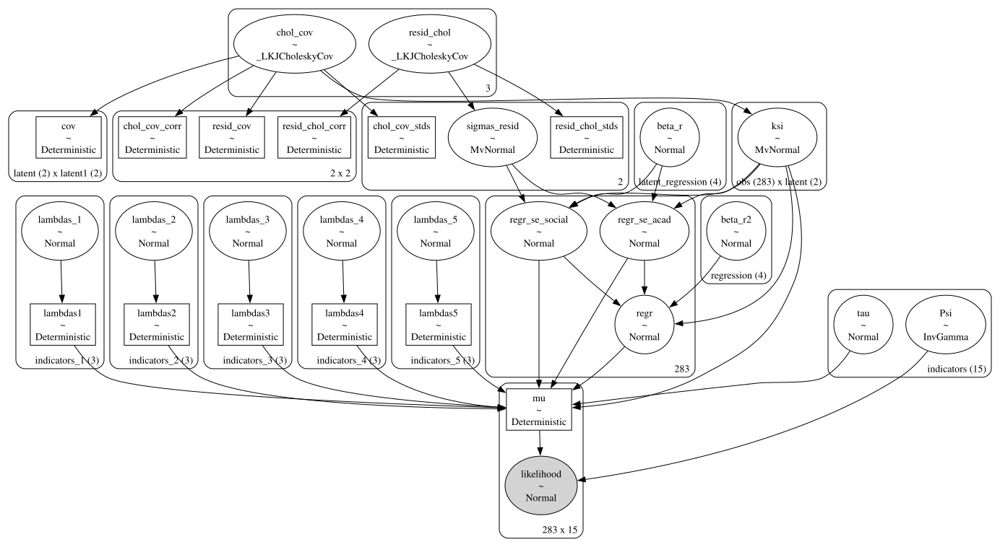

In [26]:
pm.model_to_graphviz(model_sem0)

It's worth pausing to examine the nature of the dependencies sketched in this diagram. We can see here how we've replaced the simpler measurement model structure and added three regression functions that replace the draws from the multivariate normal $Ksi$. In other words we've expressed a dependency as a series of regressions all within the one model. Next we'll see how the parameter estimates change across our prior specifications for the model. Notice the relative stability of the factor loadings compared to the regression coefficients. 

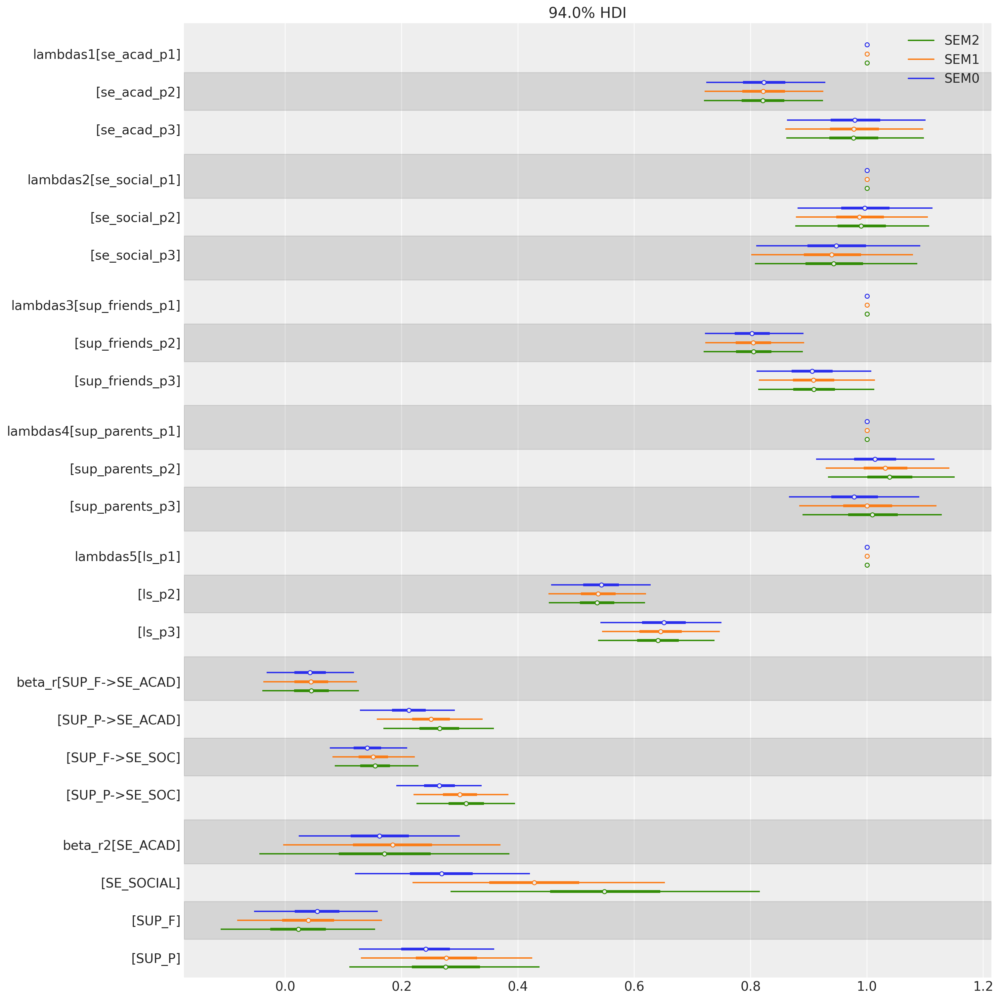

In [27]:
fig, ax = plt.subplots(figsize=(15, 15))
az.plot_forest(
    [idata_sem0, idata_sem1, idata_sem2],
    model_names=["SEM0", "SEM1", "SEM2"],
    var_names=["lambdas1", "lambdas2", "lambdas3", "lambdas4", "lambdas5", "beta_r", "beta_r2"],
    combined=True,
    ax=ax,
);

### Model Evaluation Checks

A quick evaluation of model performance suggests we do somewhat less well in recovering the sample covariance structures than we did with simpler measurement model.

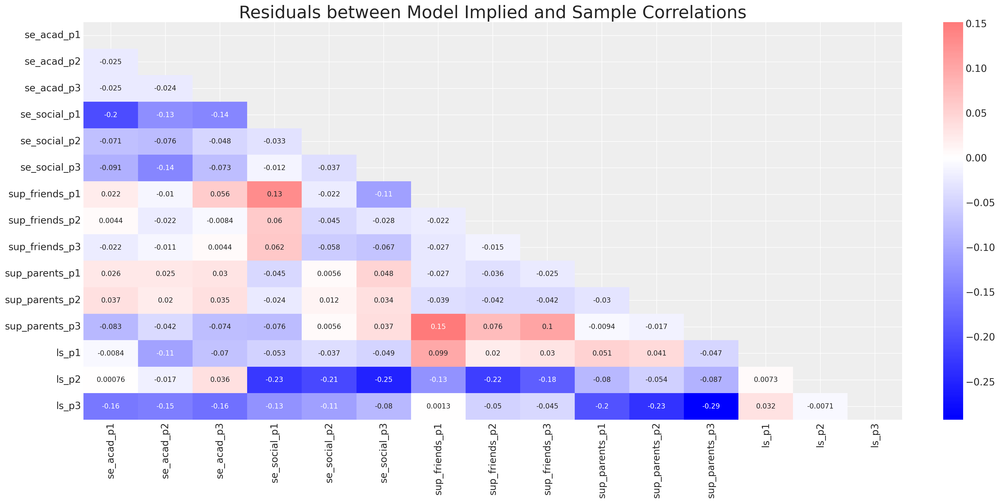

In [28]:
residuals_posterior_cov = get_posterior_resids(idata_sem0, 2500)
residuals_posterior_corr = get_posterior_resids(idata_sem0, 2500, metric="corr")

fig, ax = plt.subplots(figsize=(20, 10))
mask = np.triu(np.ones_like(residuals_posterior_corr, dtype=bool))
ax = sns.heatmap(residuals_posterior_corr, annot=True, cmap="bwr", center=0, mask=mask)
ax.set_title("Residuals between Model Implied and Sample Correlations", fontsize=25);

But the posterior predictive checks still look reasonable. Our focal quantity of life-satisfaction seems to be recovered well.

/var/folders/__/ng_3_9pn1f11ftyml_qr69vh0000gn/T/ipykernel_65351/3491944590.py:25: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


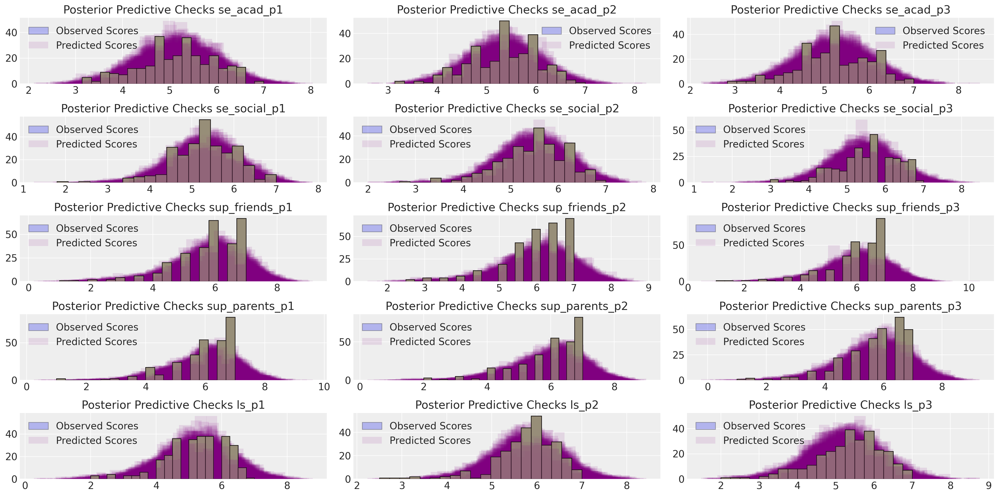

In [29]:
make_ppc(idata_sem0, 100, drivers=drivers, dims=(5, 3))

Model diagnostics show generally healthy looking trace plots with some divergences, but the effective sample sizea and r-hat measures are fine so we should be generally pretty happy that the model has converged to the posterior distribution well.

/Users/nathanielforde/mambaforge/envs/pymc_causal/lib/python3.11/site-packages/arviz/stats/density_utils.py:487: UserWarning: Your data appears to have a single value or no finite values
  warnings.warn("Your data appears to have a single value or no finite values")
/Users/nathanielforde/mambaforge/envs/pymc_causal/lib/python3.11/site-packages/arviz/stats/density_utils.py:487: UserWarning: Your data appears to have a single value or no finite values
  warnings.warn("Your data appears to have a single value or no finite values")
/Users/nathanielforde/mambaforge/envs/pymc_causal/lib/python3.11/site-packages/arviz/stats/density_utils.py:487: UserWarning: Your data appears to have a single value or no finite values
  warnings.warn("Your data appears to have a single value or no finite values")
/Users/nathanielforde/mambaforge/envs/pymc_causal/lib/python3.11/site-packages/arviz/stats/density_utils.py:487: UserWarning: Your data appears to have a single value or no finite values
  warnings.w

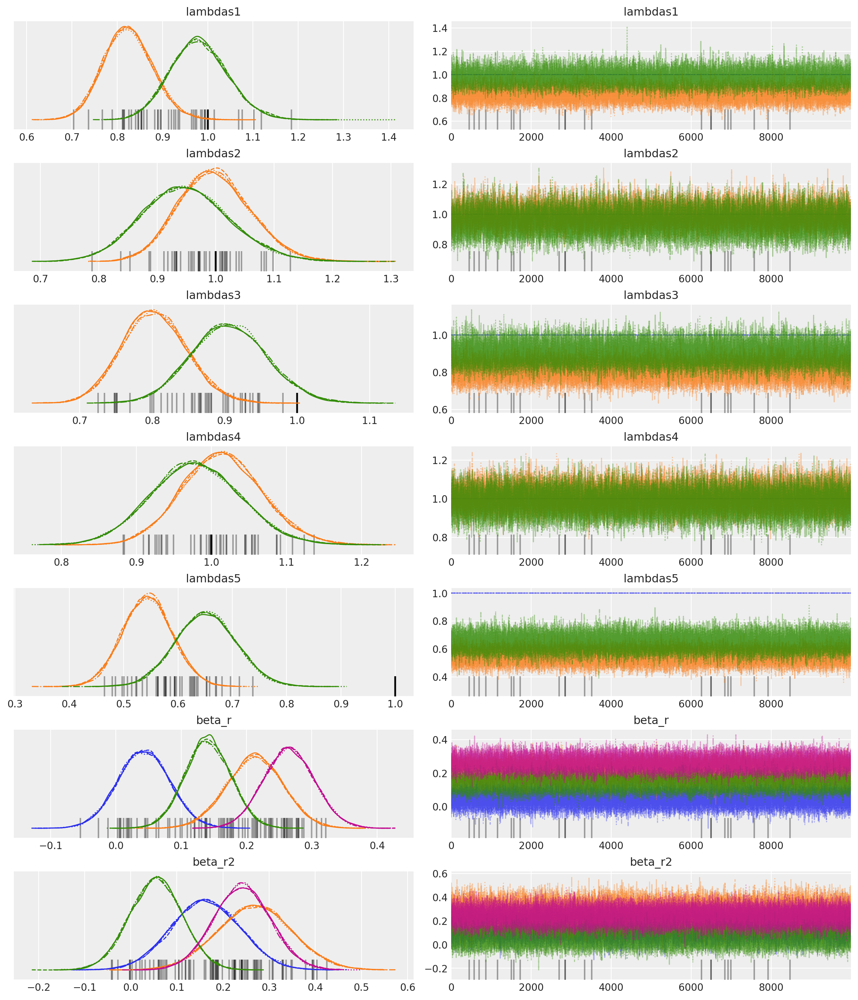

In [30]:
az.plot_trace(
    idata_sem0,
    var_names=["lambdas1", "lambdas2", "lambdas3", "lambdas4", "lambdas5", "beta_r", "beta_r2"],
);

In [31]:
az.summary(
    idata_sem0,
    var_names=[
        "lambdas1",
        "lambdas2",
        "lambdas3",
        "lambdas4",
        "lambdas5",
        "beta_r",
        "beta_r2",
        "Psi",
        "tau",
    ],
)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
lambdas1[se_acad_p1],1.000,0.000,1.000,1.000,0.000,0.000,40000.0,40000.0,NaN
lambdas1[se_acad_p2],0.824,0.055,0.724,0.929,0.001,0.000,9055.0,15410.0,1.0
lambdas1[se_acad_p3],0.981,0.063,0.862,1.101,0.001,0.000,8363.0,13866.0,1.0
lambdas2[se_social_p1],1.000,0.000,1.000,1.000,0.000,0.000,40000.0,40000.0,NaN
lambdas2[se_social_p2],0.999,0.062,0.880,1.113,0.001,0.001,5468.0,10031.0,1.0
lambdas2[se_social_p3],0.949,0.075,0.809,1.092,0.001,0.001,9508.0,16102.0,1.0
lambdas3[sup_friends_p1],1.000,0.000,1.000,1.000,0.000,0.000,40000.0,40000.0,NaN
lambdas3[sup_friends_p2],0.803,0.045,0.721,0.891,0.000,0.000,10150.0,17200.0,1.0
lambdas3[sup_friends_p3],0.906,0.053,0.810,1.008,0.001,0.000,10981.0,19125.0,1.0
lambdas4[sup_parents_p1],1.000,0.000,1.000,1.000,0.000,0.000,40000.0,40000.0,NaN


Similar diagnostic results hold for the other models. We now continue to assess questions of direct and indirect effects that were obscure in the simpler measurement model. By which I mean we trace out the total paths that influence life-satisfaction and assess the relative strength of impact  due to parental and peer support.  

### Indirect and Direct Effects

We now turn the additional regression structures that we've encoded into the model graph. First we pull out the regression coefficients 

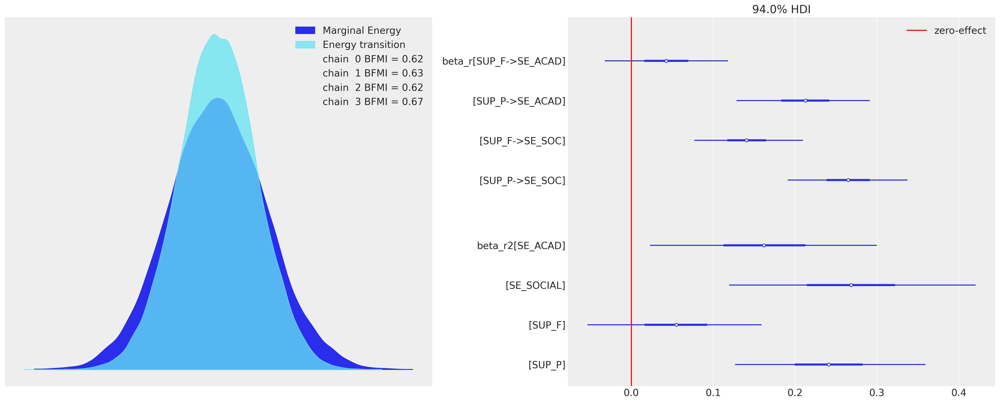

In [32]:
fig, axs = plt.subplots(1, 2, figsize=(20, 8))

az.plot_energy(idata_sem0, ax=axs[0])

az.plot_forest(idata_sem0, var_names=["beta_r", "beta_r2"], combined=True, ax=axs[1])
axs[1].axvline(0, color="red", label="zero-effect")
axs[1].legend();

The coefficients indicate a smaller relative weight accorded to the effects of peer support than we see with parental support. This is borne out as we trace out the cumulative causal effects (direct and indirect) through our DAG or chain of regression coefficients. 

In [33]:
def calculate_effects(idata, var="SUP_P"):
    summary_df = az.summary(idata, var_names=["beta_r", "beta_r2"])
    # Indirect Paths
    ## VAR -> SE_SOC ->LS
    indirect_parent_soc = (
        summary_df.loc[f"beta_r[{var}->SE_SOC]"]["mean"]
        * summary_df.loc["beta_r2[SE_SOCIAL]"]["mean"]
    )

    ## VAR -> SE_SOC ->LS
    indirect_parent_acad = (
        summary_df.loc[f"beta_r[{var}->SE_ACAD]"]["mean"]
        * summary_df.loc["beta_r2[SE_ACAD]"]["mean"]
    )

    ## Total Indirect Effects
    total_indirect = indirect_parent_soc + indirect_parent_acad

    ## Total Effects
    total_effect = total_indirect + summary_df.loc[f"beta_r2[{var}]"]["mean"]

    return pd.DataFrame(
        [[indirect_parent_soc, indirect_parent_acad, total_indirect, total_effect]],
        columns=[
            f"{var} -> SE_SOC ->LS",
            f"{var} -> SE_ACAD ->LS",
            f"Total Indirect Effects {var}",
            f"Total Effects {var}",
        ],
    )

Importantly we see here the effect of priors on the implied relationships. As we pull our priors closer to 0 the total effects of parental support is pulled downwards away from .5, while the peer support remains relatively stable ~.10. However it remains clear that the impact of parental support dwarfs the effects due to peer support. 

In [34]:
summary_p = pd.concat(
    [calculate_effects(idata_sem0), calculate_effects(idata_sem1), calculate_effects(idata_sem2)]
)

summary_p.index = ["SEM0", "SEM1", "SEM2"]
summary_p

,SUP_P -> SE_SOC ->LS,SUP_P -> SE_ACAD ->LS,Total Indirect Effects SUP_P,Total Effects SUP_P
SEM0,0.071285,0.034506,0.105791,0.346791
SEM1,0.129129,0.046435,0.175564,0.452564
SEM2,0.171600,0.045315,0.216915,0.492915


The sensitivity of the estimated impact due to parental support varies strongly as a function of our prior on the variances. Here is a substantive example of the role of theory choice in model design. How strongly should believe that parental and peer effects have 0 effect on life-satisfaction? I'm inclined to believe we're too conservative if we try and shrink the effect toward zero and should prefer a less conservative model. However, the example here is not to dispute the issue, but demonstrate the importance of sensitivity checks. 

In [35]:
summary_f = pd.concat(
    [
        calculate_effects(idata_sem0, "SUP_F"),
        calculate_effects(idata_sem1, "SUP_F"),
        calculate_effects(idata_sem2, "SUP_F"),
    ]
)

summary_f.index = ["SEM0", "SEM1", "SEM2"]
summary_f

,SUP_F -> SE_SOC ->LS,SUP_F -> SE_ACAD ->LS,Total Indirect Effects SUP_F,Total Effects SUP_F
SEM0,0.037929,0.006966,0.044895,0.099895
SEM1,0.065208,0.008325,0.073533,0.112533
SEM2,0.085250,0.007695,0.092945,0.114945


# Conclusion

We've just seen how we can go from thinking about the measurment of abstract psychometric constructs, through the evaluation of complex patterns of correlation and covariances among these latent constructs to evaluating hypothetical causal structures amongst the latent factors. This is a bit of whirlwind tour of psychometric models and the expressive power of SEM and CFA models, which we're ending by linking them to the realm of causal inference! This is not an accident, but rather evidence that causal concerns sit at the heart of most modeling endeavours. When we're interested in any kind of complex joint-distribution of variables, we're likely interested in the causal structure of the system - how are the realised values of some observed metrics dependent on or related to others? Importantly, we need to understand how these observations are realised without confusing simple correlation for cause through naive or confounded inference.

Mislevy and Levy highlight this connection by focusing on the role of De Finetti's theorem in the recovery of exchangeablility through Bayesian inference. By De Finetti’s theorem a distribution of exchangeable sequence of variables be expressed as mixture of conditional independent variables.

$$ p(\mathbf{x_{1}}^{T}....\mathbf{x_{q}}^{T}) = \dfrac{p(X | \theta)p(\theta)}{p_{i}(X)} = \dfrac{p(\mathbf{x_{i}}^{T}.....\mathbf{x_{n}}^{T} | \text{Ksi}, \Psi, \tau, \Lambda, \beta)p(\text{Ksi}, \Psi, \tau, \Lambda, \beta) }{p(\mathbf{x_{i}}^{T}.....\mathbf{x_{n}}^{T})} $$

This representation licenses substantive claims about the system. So if we specify the conditional distribution __correctly__, we recover the conditions that warrant inference with a well designed model because the subject's outcomes are considered exchangeable conditional on our model. The mixture distribution is just the vector of parameters upon which we condition our model. This plays out nicely in SEM and CFA models because we explicitly structure the interaction of the system to remove biasing dependence structure and license clean inferences. Holding fixed levels of the latent constructs we expect to be able to draw generalisable claims the expected realisations of the indicator metrics. 

> [C]onditional independence is not a grace of nature for which we must wait passively, but rather a psychological necessity which we satisfy by organising our knowledge in a specific way. An important tool in such an organisation is the identification of intermediate variables that induce conditional independence among observables; if such variables are not in our vocabulary, we create them. In medical diagnosis, for instance, when some symptoms directly influence one another, the medical profession invents a name for that interaction (e.g. “syndrome”, “complication”, “pathological state”) and treats it as a new auxiliary variable that induces conditional independence.” - Pearl quoted in {cite:t}`levy2020bayesian` p61

It's this deliberate and careful focus on the structure of conditionalisation that unites the seemingly disparate disciplines of psychometrics and causal inference. Both disciplines cultivate careful thinking about the structure of the data generating process and, more, they proffer conditionalisation strategies to better target some estimand of interest. Both are well phrased in the expressive lexicon of a probabilistic programming language like `PyMC`. We encourage you to explore the rich possibilities for yourself! 


## Authors
- Authored by [Nathaniel Forde](https://nathanielf.github.io/posts/post-with-code/CFA_AND_SEM/CFA_AND_SEM.html) in September 2024 

## References
:::{bibliography}
:filter: docname in docnames
:::

## Watermark

In [36]:
%load_ext watermark
%watermark -n -u -v -iv -w -p pytensor

Last updated: Sun Sep 08 2024

Python implementation: CPython
Python version       : 3.11.7
IPython version      : 8.20.0

pytensor: 2.18.6

arviz     : 0.17.0
pymc      : 5.10.3
pandas    : 2.2.0
pytensor  : 2.18.6
matplotlib: 3.8.2
numpy     : 1.24.4
seaborn   : 0.13.2

Watermark: 2.4.3

